In [543]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from sklearn.cluster import KMeans
import warnings
warnings.filterwarnings("ignore")

In [544]:
df1 = pd.read_csv("globalterrorismdb_0718dist.csv",encoding='latin1')

In [545]:
data

,eventid,year,month,iday,approxdate,extended,resolution,country,country_txt,region,...,scite1,scite2,scite3,dbsource,INT_LOG,INT_IDEO,INT_MISC,INT_ANY,related,date
0,1.970000e+11,1970,7,2,NaN,0,NaN,58,Dominican Republic,2,...,NaN,NaN,NaN,PGIS,0,0,0,0,NaN,7
2,1.970010e+11,1970,1,0,NaN,0,NaN,160,Philippines,5,...,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN,1
3,1.970010e+11,1970,1,0,NaN,0,NaN,78,Greece,8,...,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN,1
4,1.970010e+11,1970,1,0,NaN,0,NaN,101,Japan,4,...,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN,1
5,1.970010e+11,1970,1,1,NaN,0,NaN,217,United States,1,...,"""Police Chief Quits,"" Washington Post, January...","""Cairo Police Chief Quits; Decries Local 'Mili...","Christopher Hewitt, ""Political Violence and Te...",Hewitt Project,-9,-9,0,-9,NaN,1
6,1.970010e+11,1970,1,2,NaN,0,NaN,218,Uruguay,3,...,NaN,NaN,NaN,PGIS,0,0,0,0,NaN,1
7,1.970010e+11,1970,1,2,NaN,0,NaN,217,United States,1,...,Committee on Government Operations United Stat...,"Christopher Hewitt, ""Political Violence and Te...",NaN,Hewitt Project,-9,-9,0,-9,NaN,1
8,1.970010e+11,1970,1,2,NaN,0,NaN,217,United States,1,...,"Tom Bates, ""Rads: The 1970 Bombing of the Army...","David Newman, Sandra Sutherland, and Jon Stewa...","The Wisconsin Cartographers' Guild, ""Wisconsin...",Hewitt Project,0,0,0,0,NaN,1
9,1.970010e+11,1970,1,3,NaN,0,NaN,217,United States,1,...,Committee on Government Operations United Stat...,"Tom Bates, ""Rads: The 1970 Bombing of the Army...","David Newman, Sandra Sutherland, and Jon Stewa...",Hewitt Project,0,0,0,0,NaN,1
10,1.970010e+11,1970,1,1,NaN,0,NaN,217,United States,1,...,NaN,NaN,NaN,PGIS,0,0,0,0,NaN,1


In [546]:

data=df1.rename(columns={"MANO-D":"group","iyear":"year","imonth":"month"})

In [547]:
data=data[(data.month!=0)]

In [548]:
data.shape

(72779, 135)

In [549]:
data["date"]=data["year"].apply(lambda x:(x-1970)*12)+data["month"]

In [550]:
data

,eventid,year,month,iday,approxdate,extended,resolution,country,country_txt,region,...,scite1,scite2,scite3,dbsource,INT_LOG,INT_IDEO,INT_MISC,INT_ANY,related,date
0,1.970000e+11,1970,7,2,NaN,0,NaN,58,Dominican Republic,2,...,NaN,NaN,NaN,PGIS,0,0,0,0,NaN,7
2,1.970010e+11,1970,1,0,NaN,0,NaN,160,Philippines,5,...,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN,1
3,1.970010e+11,1970,1,0,NaN,0,NaN,78,Greece,8,...,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN,1
4,1.970010e+11,1970,1,0,NaN,0,NaN,101,Japan,4,...,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN,1
5,1.970010e+11,1970,1,1,NaN,0,NaN,217,United States,1,...,"""Police Chief Quits,"" Washington Post, January...","""Cairo Police Chief Quits; Decries Local 'Mili...","Christopher Hewitt, ""Political Violence and Te...",Hewitt Project,-9,-9,0,-9,NaN,1
6,1.970010e+11,1970,1,2,NaN,0,NaN,218,Uruguay,3,...,NaN,NaN,NaN,PGIS,0,0,0,0,NaN,1
7,1.970010e+11,1970,1,2,NaN,0,NaN,217,United States,1,...,Committee on Government Operations United Stat...,"Christopher Hewitt, ""Political Violence and Te...",NaN,Hewitt Project,-9,-9,0,-9,NaN,1
8,1.970010e+11,1970,1,2,NaN,0,NaN,217,United States,1,...,"Tom Bates, ""Rads: The 1970 Bombing of the Army...","David Newman, Sandra Sutherland, and Jon Stewa...","The Wisconsin Cartographers' Guild, ""Wisconsin...",Hewitt Project,0,0,0,0,NaN,1
9,1.970010e+11,1970,1,3,NaN,0,NaN,217,United States,1,...,Committee on Government Operations United Stat...,"Tom Bates, ""Rads: The 1970 Bombing of the Army...","David Newman, Sandra Sutherland, and Jon Stewa...",Hewitt Project,0,0,0,0,NaN,1
10,1.970010e+11,1970,1,1,NaN,0,NaN,217,United States,1,...,NaN,NaN,NaN,PGIS,0,0,0,0,NaN,1


In [551]:
data.columns

Index(['eventid', 'year', 'month', 'iday', 'approxdate', 'extended',
       'resolution', 'country', 'country_txt', 'region',
       ...
       'scite1', 'scite2', 'scite3', 'dbsource', 'INT_LOG', 'INT_IDEO',
       'INT_MISC', 'INT_ANY', 'related', 'date'],
      dtype='object', length=136)

In [576]:
y=data[["date","latitude","longitude","nkill","nwound","gname"]].dropna()
y=y[y.gname!="Unknown"]
yn=y[["date","latitude","longitude","nkill","nwound"]]

In [577]:
y.head()

,date,latitude,longitude,nkill,nwound,gname
0,7,18.456792,-69.951164,1.0,0.0,MANO-D
5,1,37.005105,-89.176269,0.0,0.0,Black Nationalists
6,1,-34.891151,-56.187214,0.0,0.0,Tupamaros (Uruguay)
8,1,43.076592,-89.412488,0.0,0.0,New Year's Gang
9,1,43.072950,-89.386694,0.0,0.0,New Year's Gang


In [578]:
yn.head()

,date,latitude,longitude,nkill,nwound
0,7,18.456792,-69.951164,1.0,0.0
5,1,37.005105,-89.176269,0.0,0.0
6,1,-34.891151,-56.187214,0.0,0.0
8,1,43.076592,-89.412488,0.0,0.0
9,1,43.072950,-89.386694,0.0,0.0


In [579]:
pp.groupby("level").count()

,date
level,
0,1901
10,206
50,42
100,35
200,20
1000,6


In [580]:
dic=y["gname"].value_counts().to_dict()
ls=[key for (key, val) in dic.items() if val > 1000]
ls

['Shining Path (SL)',
 'Farabundo Marti National Liberation Front (FMLN)',
 'Basque Fatherland and Freedom (ETA)',
 'Irish Republican Army (IRA)',
 'Revolutionary Armed Forces of Colombia (FARC)',
 'National Liberation Army of Colombia (ELN)']

In [581]:
yd=y[y["gname"].map(lambda x: x in ls)]
ydn=yd[["date","latitude","longitude","nkill","nwound"]]
ydnorm=(ydn-ydn.mean())/(ydn.max()-ydn.min())
yd.head()

,date,latitude,longitude,nkill,nwound,gname
625,12,43.291618,-1.977903,0.0,0.0,Basque Fatherland and Freedom (ETA)
899,17,43.291618,-1.977903,0.0,0.0,Basque Fatherland and Freedom (ETA)
1125,25,43.150000,-2.610278,0.0,0.0,Basque Fatherland and Freedom (ETA)
1161,26,54.607712,-5.956210,7.0,17.0,Irish Republican Army (IRA)
1167,26,53.361675,-6.245485,0.0,0.0,Irish Republican Army (IRA)


In [582]:
ydn=yd[["date","latitude","longitude","nkill","nwound"]]

In [583]:
ydnorm=(ydn-ydn.mean())/(ydn.max()-ydn.min())
ydnorm.head()

,date,latitude,longitude,nkill,nwound
625,-0.552368,0.317937,0.451083,-0.011876,-0.005223
899,-0.538891,0.317937,0.451083,-0.011876,-0.005223
1125,-0.517327,0.316399,0.445901,-0.011876,-0.005223
1161,-0.514632,0.440812,0.418484,0.030548,0.066205
1167,-0.514632,0.427282,0.416114,-0.011876,-0.005223


In [584]:
yd["6label"]=KMeans(n_clusters=6, random_state=0).fit(ydnorm).labels_

# True attacks

In [585]:
yd["groupid"]=yd["gname"].map(dicn)
yd

,date,latitude,longitude,nkill,nwound,gname,6label,groupid
625,12,43.291618,-1.977903,0.0,0.0,Basque Fatherland and Freedom (ETA),3,2
899,17,43.291618,-1.977903,0.0,0.0,Basque Fatherland and Freedom (ETA),3,2
1125,25,43.150000,-2.610278,0.0,0.0,Basque Fatherland and Freedom (ETA),3,2
1161,26,54.607712,-5.956210,7.0,17.0,Irish Republican Army (IRA),3,3
1167,26,53.361675,-6.245485,0.0,0.0,Irish Republican Army (IRA),3,3
1184,26,51.248429,-0.755979,7.0,19.0,Irish Republican Army (IRA),3,3
1200,27,54.607712,-5.956210,2.0,130.0,Irish Republican Army (IRA),3,3
1462,32,43.230556,-2.845833,1.0,1.0,Basque Fatherland and Freedom (ETA),3,2
1640,36,6.242026,-75.564766,0.0,0.0,National Liberation Army of Colombia (ELN),4,5
1708,37,42.815372,-1.653616,0.0,0.0,Basque Fatherland and Freedom (ETA),3,2


# Visualization

In [586]:
import mplleaflet

In [587]:
import seaborn as sns
graph_outputs = []
for k in range(6):
    n=min(len(yd[yd["gname"]==lst[k]]),1000)
    ax1 = yd[yd["gname"]==lst[k]].sample(n).plot.scatter(x="longitude", y="latitude")
    graph_outputs.append(mplleaflet.display(ax1.figure))


# Basque Fatherland and Freedom (ETA)

In [588]:
graph_outputs[0]

# Irish Republican Army (IRA)

In [589]:
graph_outputs[1]

# National Liberation Army of Colombia (ELN)

In [590]:
graph_outputs[2]

# Revolutionary Armed Forces of Colombia (FARC)

In [591]:
graph_outputs[3]

# Farabundo Marti National Liberation Front (FMLN)

In [592]:
graph_outputs[4]

# Shining Path (SL)

In [569]:
graph_outputs[5]

# Unsupervised clustering

In [570]:
yd=y[y["gname"].map(lambda x: x in ls)]
ydn=yd[["date","latitude","longitude","nkill","nwound"]]
ydnorm=(ydn-ydn.mean())/(ydn.max()-ydn.min())
yd["6label"]=KMeans(n_clusters=6, random_state=0).fit(ydnorm).labels_



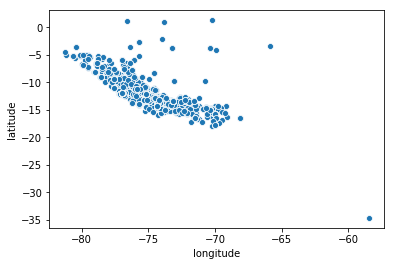

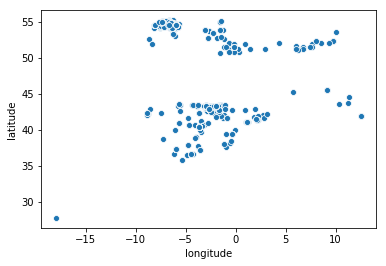

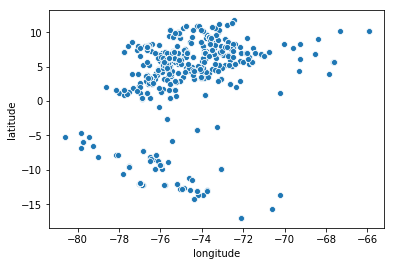

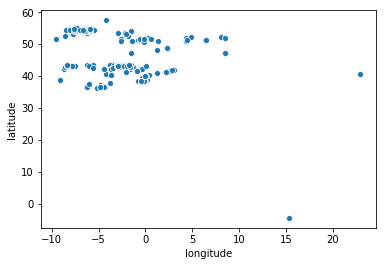

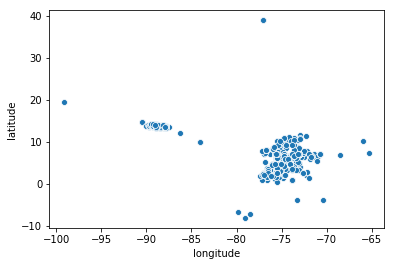

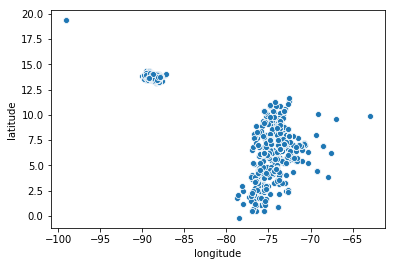

In [571]:
import seaborn as sns
for k in range(6):
    ax1 = sns.scatterplot(x="longitude", y="latitude", data=yd[yd["6label"]==k])
    plt.show()

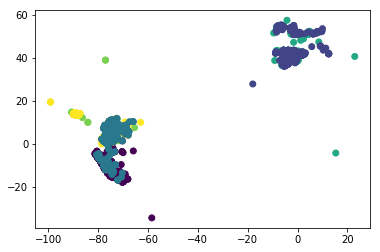

In [572]:
ax2 = plt.scatter(yd.longitude, yd.latitude, c=yd["6label"])

# Supervised Classification

In [573]:
ls=yd.gname.unique()
dic={}
for i in range(6):
    dic[ls[i]]=i

In [574]:
yd["groupid"]=yd.gname.map(dic)

In [575]:
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import make_scorer,accuracy_score
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.datasets import make_classification

X=yd[["date","latitude","longitude","nkill","nwound"]]
y=yd["groupid"]

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42)

clf = RandomForestClassifier()

parameters = {'n_estimators' : range(1,200,5),"max_depth":range(2,10)}


scorer = make_scorer(accuracy_score)


grid_obj = GridSearchCV(estimator = clf, param_grid = parameters, scoring = scorer, verbose = 3)


grid_fit = grid_obj.fit(X_train, y_train)


best_clf = grid_fit.best_estimator_

# Make predictions using the unoptimized and model
predictions = (clf.fit(X_train, y_train)).predict(X_test)
best_predictions = best_clf.predict(X_test)

# Report the before-and-afterscores
print("Unoptimized model\n------")
print("Accuracy score on testing data: {:.4f}".format(accuracy_score(y_test, predictions)))

Fitting 3 folds for each of 320 candidates, totalling 960 fits
[CV] max_depth=2, n_estimators=1 .....................................
[CV]  max_depth=2, n_estimators=1, score=0.5589390962671905, total=   0.0s
[CV] max_depth=2, n_estimators=1 .....................................
[CV]  max_depth=2, n_estimators=1, score=0.6698329511955453, total=   0.0s
[CV] max_depth=2, n_estimators=1 .....................................
[CV]  max_depth=2, n_estimators=1, score=0.5558833169452638, total=   0.0s
[CV] max_depth=2, n_estimators=6 .....................................
[CV]  max_depth=2, n_estimators=6, score=0.7118533071381794, total=   0.0s
[CV] max_depth=2, n_estimators=6 .....................................
[CV]  max_depth=2, n_estimators=6, score=0.7127415656731084, total=   0.0s
[CV] max_depth=2, n_estimators=6 .....................................
[CV]  max_depth=2, n_estimators=6, score=0.8138315306456899, total=   0.0s
[CV] max_depth=2, n_estimators=11 ...........................

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


[CV]  max_depth=2, n_estimators=11, score=0.7250081940347427, total=   0.0s
[CV] max_depth=2, n_estimators=16 ....................................
[CV]  max_depth=2, n_estimators=16, score=0.6990831696136215, total=   0.0s
[CV] max_depth=2, n_estimators=16 ....................................
[CV]  max_depth=2, n_estimators=16, score=0.8123157549950868, total=   0.0s
[CV] max_depth=2, n_estimators=16 ....................................
[CV]  max_depth=2, n_estimators=16, score=0.8302196001311045, total=   0.0s
[CV] max_depth=2, n_estimators=21 ....................................
[CV]  max_depth=2, n_estimators=21, score=0.7301899148657498, total=   0.0s
[CV] max_depth=2, n_estimators=21 ....................................
[CV]  max_depth=2, n_estimators=21, score=0.8562070094988535, total=   0.1s
[CV] max_depth=2, n_estimators=21 ....................................
[CV]  max_depth=2, n_estimators=21, score=0.7843330055719436, total=   0.1s
[CV] max_depth=2, n_estimators=26 ........

[CV]  max_depth=2, n_estimators=106, score=0.8198493285293155, total=   0.2s
[CV] max_depth=2, n_estimators=106 ...................................
[CV]  max_depth=2, n_estimators=106, score=0.8243198951163553, total=   0.3s
[CV] max_depth=2, n_estimators=111 ...................................
[CV]  max_depth=2, n_estimators=111, score=0.8569089718402095, total=   0.2s
[CV] max_depth=2, n_estimators=111 ...................................
[CV]  max_depth=2, n_estimators=111, score=0.7641663937111038, total=   0.2s
[CV] max_depth=2, n_estimators=111 ...................................
[CV]  max_depth=2, n_estimators=111, score=0.8177646673221894, total=   0.3s
[CV] max_depth=2, n_estimators=116 ...................................
[CV]  max_depth=2, n_estimators=116, score=0.8140144073346431, total=   0.2s
[CV] max_depth=2, n_estimators=116 ...................................
[CV]  max_depth=2, n_estimators=116, score=0.8277104487389453, total=   0.3s
[CV] max_depth=2, n_estimators=116 

[CV]  max_depth=3, n_estimators=16, score=0.9243367179823124, total=   0.0s
[CV] max_depth=3, n_estimators=16 ....................................
[CV]  max_depth=3, n_estimators=16, score=0.9275647328744674, total=   0.0s
[CV] max_depth=3, n_estimators=21 ....................................
[CV]  max_depth=3, n_estimators=21, score=0.9302554027504911, total=   0.0s
[CV] max_depth=3, n_estimators=21 ....................................
[CV]  max_depth=3, n_estimators=21, score=0.9230265312807076, total=   0.0s
[CV] max_depth=3, n_estimators=21 ....................................
[CV]  max_depth=3, n_estimators=21, score=0.9272369714847591, total=   0.0s
[CV] max_depth=3, n_estimators=26 ....................................
[CV]  max_depth=3, n_estimators=26, score=0.935494433529797, total=   0.1s
[CV] max_depth=3, n_estimators=26 ....................................
[CV]  max_depth=3, n_estimators=26, score=0.9213887979037013, total=   0.1s
[CV] max_depth=3, n_estimators=26 .........

[CV]  max_depth=3, n_estimators=111, score=0.9351669941060904, total=   0.2s
[CV] max_depth=3, n_estimators=111 ...................................
[CV]  max_depth=3, n_estimators=111, score=0.9305601048149361, total=   0.2s
[CV] max_depth=3, n_estimators=111 ...................................
[CV]  max_depth=3, n_estimators=111, score=0.9265814487053425, total=   0.2s
[CV] max_depth=3, n_estimators=116 ...................................
[CV]  max_depth=3, n_estimators=116, score=0.9361493123772102, total=   0.2s
[CV] max_depth=3, n_estimators=116 ...................................
[CV]  max_depth=3, n_estimators=116, score=0.9276121847363249, total=   0.2s
[CV] max_depth=3, n_estimators=116 ...................................
[CV]  max_depth=3, n_estimators=116, score=0.9308423467715503, total=   0.2s
[CV] max_depth=3, n_estimators=121 ...................................
[CV]  max_depth=3, n_estimators=121, score=0.9305828421741977, total=   0.2s
[CV] max_depth=3, n_estimators=121 

[CV]  max_depth=4, n_estimators=16, score=0.9413883431565161, total=   0.0s
[CV] max_depth=4, n_estimators=16 ....................................
[CV]  max_depth=4, n_estimators=16, score=0.9439895185063871, total=   0.0s
[CV] max_depth=4, n_estimators=16 ....................................
[CV]  max_depth=4, n_estimators=16, score=0.9446083251392986, total=   0.0s
[CV] max_depth=4, n_estimators=21 ....................................
[CV]  max_depth=4, n_estimators=21, score=0.9446627373935822, total=   0.0s
[CV] max_depth=4, n_estimators=21 ....................................
[CV]  max_depth=4, n_estimators=21, score=0.9420242384539796, total=   0.0s
[CV] max_depth=4, n_estimators=21 ....................................
[CV]  max_depth=4, n_estimators=21, score=0.9387086201245494, total=   0.1s
[CV] max_depth=4, n_estimators=26 ....................................
[CV]  max_depth=4, n_estimators=26, score=0.9404060248853962, total=   0.1s
[CV] max_depth=4, n_estimators=26 ........

[CV]  max_depth=4, n_estimators=106, score=0.9449360865290068, total=   0.2s
[CV] max_depth=4, n_estimators=111 ...................................
[CV]  max_depth=4, n_estimators=111, score=0.9384413883431565, total=   0.2s
[CV] max_depth=4, n_estimators=111 ...................................
[CV]  max_depth=4, n_estimators=111, score=0.9328529315427448, total=   0.2s
[CV] max_depth=4, n_estimators=111 ...................................
[CV]  max_depth=4, n_estimators=111, score=0.943952802359882, total=   0.2s
[CV] max_depth=4, n_estimators=116 ...................................
[CV]  max_depth=4, n_estimators=116, score=0.9482645710543549, total=   0.2s
[CV] max_depth=4, n_estimators=116 ...................................
[CV]  max_depth=4, n_estimators=116, score=0.9403865050769735, total=   0.3s
[CV] max_depth=4, n_estimators=116 ...................................
[CV]  max_depth=4, n_estimators=116, score=0.9442805637495904, total=   0.2s
[CV] max_depth=4, n_estimators=121 .

KeyboardInterrupt: 

# Best score 96.99%

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
clf = GradientBoostingClassifier()

parameters = {'n_estimators' : range(1,200,5)}


scorer = make_scorer(accuracy_score)


grid_obj = GridSearchCV(estimator = clf, param_grid = parameters, scoring = scorer, verbose = 3)


grid_fit = grid_obj.fit(X_train, y_train)


best_clf = grid_fit.best_estimator_

# Make predictions using the unoptimized and model
predictions = (clf.fit(X_train, y_train)).predict(X_test)
best_predictions = best_clf.predict(X_test)

# Report the before-and-afterscores
print("Unoptimized model\n------")
print("Accuracy score on testing data: {:.4f}".format(accuracy_score(y_test, predictions)))

# Best Score 96.68%

In [ ]:
from sklearn.multiclass import OneVsOneClassifier
from sklearn.svm import LinearSVC
OneVsOneClassifier(LinearSVC(random_state=0)).fit(X_train, y_train).score(X_test,y_test)

0.903056768558952